In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.9/914.9 kB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 82.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 77.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 18.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 50.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [4]:
!pip install gdown

In [ ]:
from google.colab import auth
from googleapiclient.discovery import build
from googleapiclient.http import MediaIoBaseDownload
import io
import os
import yaml
import cv2
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import random
from google.colab.patches import cv2_imshow
from tqdm import tqdm
from ultralytics import YOLO

In [11]:
auth.authenticate_user()

drive_service = build('drive', 'v3')
root_folder_id = "17w9yhEDZS7gLdZGjiwPQytLz3-iTUpKm"

def get_subfolders(parent_folder_id):
    """Fetch all subfolders inside a given Google Drive folder."""
    query = f"'{parent_folder_id}' in parents and mimeType = 'application/vnd.google-apps.folder'"
    results = drive_service.files().list(q=query, fields="files(id, name)").execute()
    return {item['name']: item['id'] for item in results.get('files', [])}

subfolders = get_subfolders(root_folder_id)
print("Detected Subfolders:", subfolders)

train_folder_id = subfolders.get("train", None)
test_folder_id = subfolders.get("test", None)
val_folder_id = subfolders.get("val", None)


Detected Subfolders: {'test': '1bTdin-LFV9iOM4WmnhZx4_Um1YBmWKzc', 'val': '1bUQ5gQHkbMskAlz7ho9yrW0xQYviuPKv', 'train': '1--unrzQyOZvu6oWfnSExXdO8f0AWSKVm'}


In [14]:
auth.authenticate_user()

drive_service = build('drive', 'v3')

root_folder_id = "17w9yhEDZS7gLdZGjiwPQytLz3-iTUpKm"

def get_subfolders(parent_folder_id):
    """Fetch all subfolders inside a given Google Drive folder."""
    query = f"'{parent_folder_id}' in parents and mimeType = 'application/vnd.google-apps.folder'"
    results = drive_service.files().list(q=query, fields="files(id, name)").execute()
    return {item['name']: item['id'] for item in results.get('files', [])}

main_folders = get_subfolders(root_folder_id)
train_folder_id = main_folders.get("train")
test_folder_id = main_folders.get("test")
val_folder_id = main_folders.get("val")

print("Train Folder ID:", train_folder_id)
print("Test Folder ID:", test_folder_id)
print("Val Folder ID:", val_folder_id)


Train Folder ID: 1--unrzQyOZvu6oWfnSExXdO8f0AWSKVm
Test Folder ID: 1bTdin-LFV9iOM4WmnhZx4_Um1YBmWKzc
Val Folder ID: 1bUQ5gQHkbMskAlz7ho9yrW0xQYviuPKv


In [15]:
train_subfolders = get_subfolders(train_folder_id)
test_subfolders = get_subfolders(test_folder_id)
val_subfolders = get_subfolders(val_folder_id)

train_images_id = train_subfolders.get("images")
train_labels_id = train_subfolders.get("labels")

test_images_id = test_subfolders.get("images")
test_labels_id = test_subfolders.get("labels")

val_images_id = val_subfolders.get("images")
val_labels_id = val_subfolders.get("labels")

print("\nDetected Subfolders:")
print(f"Train Images: {train_images_id}, Train Labels: {train_labels_id}")
print(f"Test Images: {test_images_id}, Test Labels: {test_labels_id}")
print(f"Val Images: {val_images_id}, Val Labels: {val_labels_id}")



Detected Subfolders:
Train Images: 1-70FiQqQDwYGm00DeFC8fG1zqIgaNqiq, Train Labels: 1-5_5lIXw7Rj95ABMGP7gax7EtkU9qB8z
Test Images: 1b_cn449vhoQVHNQHicKPEmk3YSB6ziK9, Test Labels: 1b_5Qg-kalFGnxjOMgXFJEpgM285dO3pD
Val Images: 1bcS6eekjc7hOirA23cUzujoDkOAlBt4v, Val Labels: 1bbA64i0jyjt8q4SVh1lsk6U8MlO7CYV-


In [17]:
drive.mount('/content/drive')

dataset_path = "/content/drive/My Drive/soccerNet_yolo8_dataset_new"

print("Files in dataset folder:", os.listdir(dataset_path))


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Files in dataset folder: ['test', 'train', 'val', 'data.yaml']


In [18]:
dataset_path = "/content/drive/My Drive/soccerNet_yolo8_dataset_new"

dataset_folders = ["train", "test", "val"]

for folder in dataset_folders:
    folder_path = os.path.join(dataset_path, folder)
    if os.path.exists(folder_path):
        subfolders = os.listdir(folder_path)
        print(f"\n📂 {folder} contains:")
        for subfolder in subfolders:
            print(f"  ├── {subfolder}")
    else:
        print(f"\n❌ {folder} not found.")



📂 train contains:
  ├── images
  ├── labels
  ├── labels.cache

📂 test contains:
  ├── images
  ├── labels

📂 val contains:
  ├── images
  ├── labels
  ├── labels.cache


In [19]:
yaml_path = os.path.join(dataset_path, "data.yaml")

if os.path.exists(yaml_path):
    with open(yaml_path, "r") as f:
        data_config = yaml.safe_load(f)
    print("\n📝 data.yaml contents:")
    print(data_config)
else:
    print("\n❌ data.yaml file not found.")



📝 data.yaml contents:
{'names': ['Player team left', 'Player team right', 'Goalkeeper team left', 'Goalkeeper team right', 'Ball', 'Main referee', 'Side referee', 'Staff members'], 'nc': 8, 'roboflow': {'license': 'CC BY 4.0', 'project': 'teamsrefgkball-xrdyu', 'url': 'https://universe.roboflow.com/mohamed-badreldin-cp2tc/teamsrefgkball-xrdyu/dataset/5', 'version': 5, 'workspace': 'mohamed-badreldin-cp2tc'}, 'test': 'test/images', 'train': 'train/images', 'val': 'val/images'}



🖼 Found 10212 images in /content/drive/My Drive/soccerNet_yolo8_dataset_new/train/images


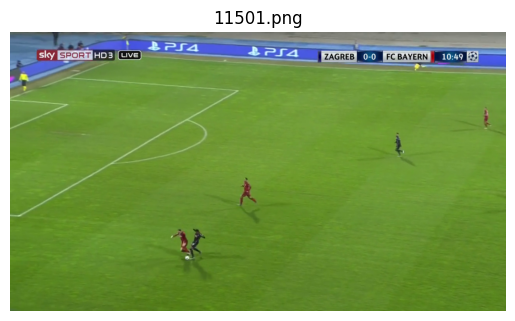

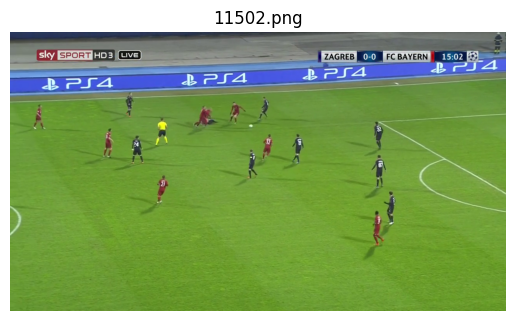

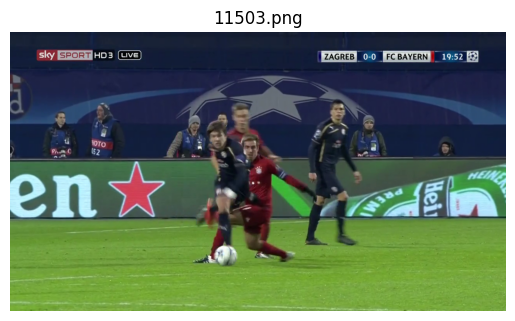


📄 Found 10212 label files in /content/drive/My Drive/soccerNet_yolo8_dataset_new/train/labels

📝 Labels in 11501.txt:
['4 0.35759765625 0.8104375 0.011210937499999973 0.019763888888888914 \n', '0 0.345640625 0.7533333333333333 0.04264062499999999 0.1011388888888888 \n', '0 0.96175390625 0.3084513888888889 0.015976562500000034 0.07640277777777776 \n', '0 0.47965234374999993 0.5745 0.036070312499999965 0.10238888888888893 \n', '1 0.78353125 0.4038333333333333 0.01764062500000003 0.08097222222222224 \n']

📝 Labels in 11502.txt:
['4 0.48579687499999996 0.33675 0.008421875000000068 0.013027777777777772 \n', '0 0.38791015624999997 0.3047638888888889 0.032007812499999976 0.07588888888888887 \n', '0 0.46129296875000003 0.28994444444444445 0.038070312500000016 0.0782222222222222 \n', '0 0.51778515625 0.4139652777777778 0.023226562500000013 0.09131944444444444 \n', '0 0.74216796875 0.7041805555555556 0.025789062499999994 0.12563888888888894 \n']

📝 Labels in 11503.txt:
['4 0.43584765625 0.80111

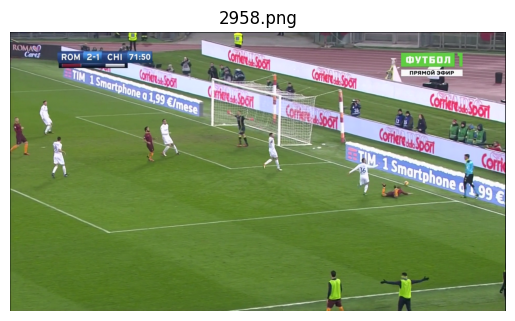

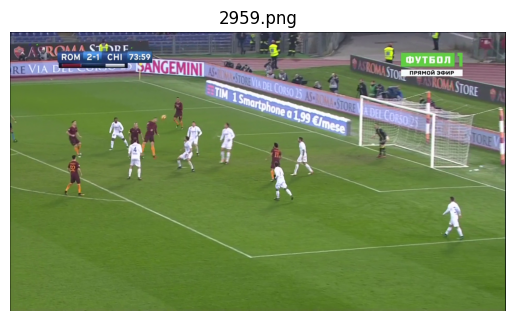

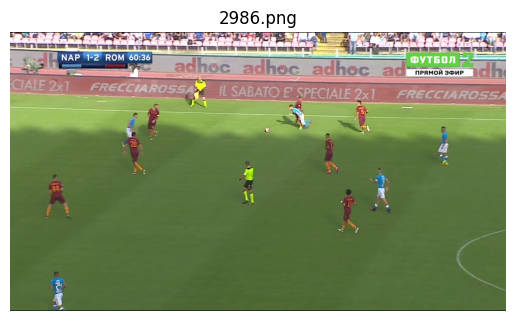


📄 Found 1276 label files in /content/drive/My Drive/soccerNet_yolo8_dataset_new/test/labels

📝 Labels in 2958.txt:
['4 0.8016041666666667 0.5418611111111111 0.014031250000000028 0.021370370370370408 \n', '0 0.27867708333333335 0.40037962962962964 0.025395833333333357 0.12696296296296297 \n', '0 0.02071354166666667 0.37221759259259257 0.036562500000000005 0.13595370370370374 \n', '0 0.7785572916666667 0.5632407407407407 0.06813541666666663 0.05700000000000006 \n', '1 0.7057005208333335 0.5145370370370371 0.054380208333333374 0.1367592592592592 \n']

📝 Labels in 2959.txt:
['4 0.3096197916666667 0.30850462962962966 0.012020833333333354 0.02493518518518514 \n', '0 0.33907552083333337 0.29118055555555555 0.022567708333333356 0.1183425925925926 \n', '0 0.2847369791666666 0.37945833333333334 0.03755729166666667 0.14830555555555552 \n', '0 0.2530546875 0.36262037037037037 0.028473958333333372 0.08103703703703702 \n', '0 0.12896614583333335 0.5120555555555555 0.039328125 0.15207407407407408 \n

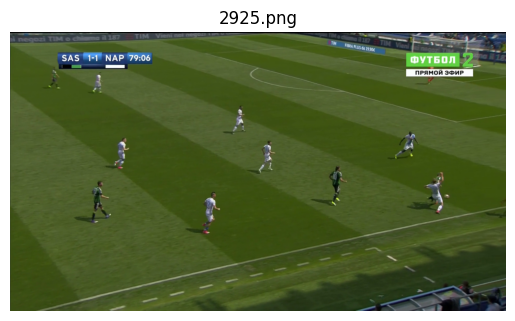

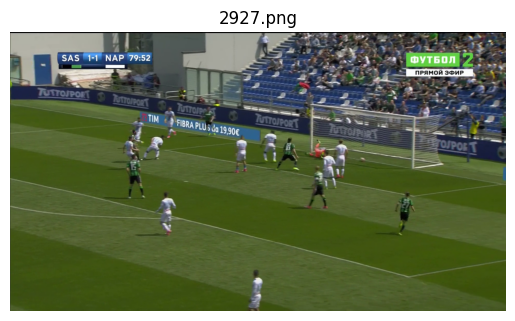

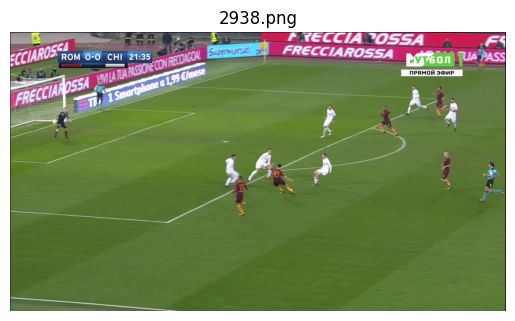


📄 Found 1276 label files in /content/drive/My Drive/soccerNet_yolo8_dataset_new/val/labels

📝 Labels in 2925.txt:
['4 0.8818177083333334 0.591037037037037 0.01384375000000008 0.019259259259259323 \n', '0 0.08780989583333333 0.1667824074074074 0.024734375000000006 0.07212037037037036 \n', '0 0.18358333333333335 0.6058472222222223 0.03770833333333335 0.13549074074074077 \n', '0 0.6627369791666666 0.548074074074074 0.034765625 0.1367777777777778 \n', '0 0.8602994791666667 0.5584027777777778 0.024380208333333424 0.11449074074074073 \n']

📝 Labels in 2927.txt:
['4 0.7101744791666665 0.4576388888888889 0.012973958333333376 0.025481481481481466 \n', '0 0.40499999999999997 0.3182083333333333 0.03064583333333335 0.1103796296296296 \n', '0 0.25538541666666664 0.41108333333333336 0.028322916666666663 0.12274074074074075 \n', '0 0.5609296875 0.4385092592592592 0.04376562499999999 0.12187037037037038 \n', '0 0.6191822916666666 0.5552175925925926 0.044291666666666646 0.15515740740740736 \n']

📝 Lab

In [20]:
def load_images(folder_path, num_images=3):
    image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
    print(f"\n🖼 Found {len(image_files)} images in {folder_path}")

    for img_name in image_files[:num_images]:
        img_path = os.path.join(folder_path, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img)
        plt.title(img_name)
        plt.axis("off")
        plt.show()

def load_labels(folder_path):
    label_files = [f for f in os.listdir(folder_path) if f.endswith('.txt') or f.endswith('.csv')]
    print(f"\n📄 Found {len(label_files)} label files in {folder_path}")

    for label_file in label_files[:3]:
        label_path = os.path.join(folder_path, label_file)
        if label_file.endswith('.txt'):
            with open(label_path, "r") as f:
                labels = f.readlines()
            print(f"\n📝 Labels in {label_file}:")
            print(labels[:5])
        elif label_file.endswith('.csv'):
            df = pd.read_csv(label_path)
            print(f"\n📝 CSV Labels in {label_file}:")
            print(df.head())

for folder in dataset_folders:
    images_folder = os.path.join(dataset_path, folder, "images")
    labels_folder = os.path.join(dataset_path, folder, "labels")

    if os.path.exists(images_folder):
        load_images(images_folder)

    if os.path.exists(labels_folder):
        load_labels(labels_folder)


In [22]:
dataset_path = Path("/content/drive/My Drive/soccerNet_yolo8_dataset_new")

train_images_path = dataset_path / "train" / "images"
val_images_path = dataset_path / "val" / "images"
test_images_path = dataset_path / "test" / "images"

train_images_count = len(list(train_images_path.glob("*.*")))
val_images_count = len(list(val_images_path.glob("*.*")))
test_images_count = len(list(test_images_path.glob("*.*")))

print(f"Train set images count: {train_images_count}")
print(f"Validation set images count: {val_images_count}")
print(f"Test set images count: {test_images_count}")


Train set images count: 10212
Validation set images count: 1276
Test set images count: 1276


Processing: 8282.png


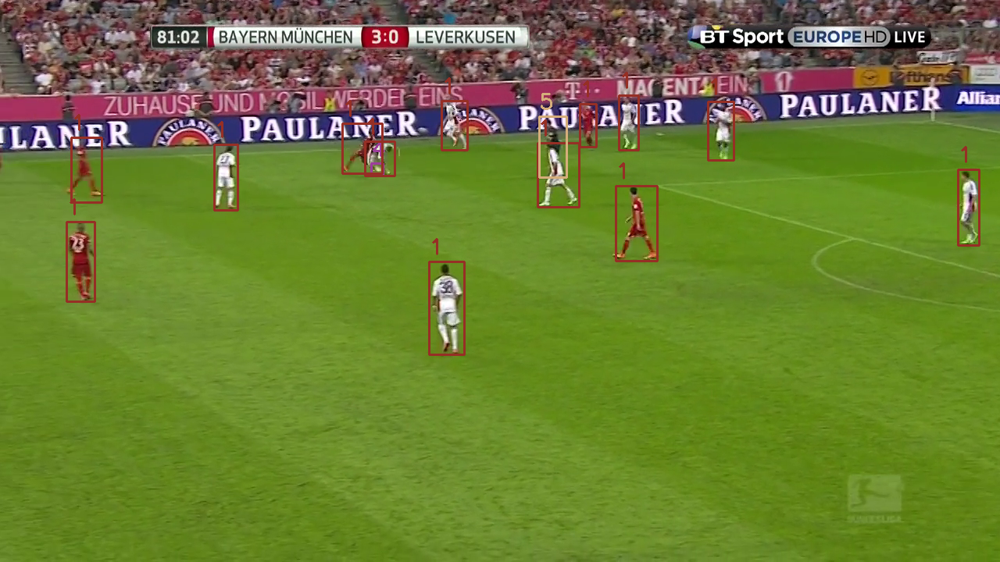

Processing: 11744.png


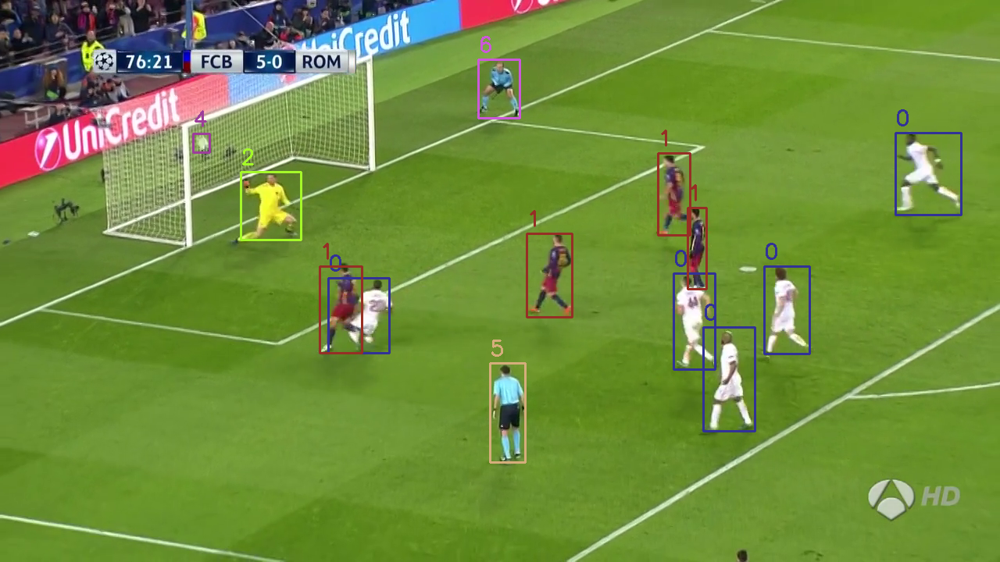

Processing: 2153.png


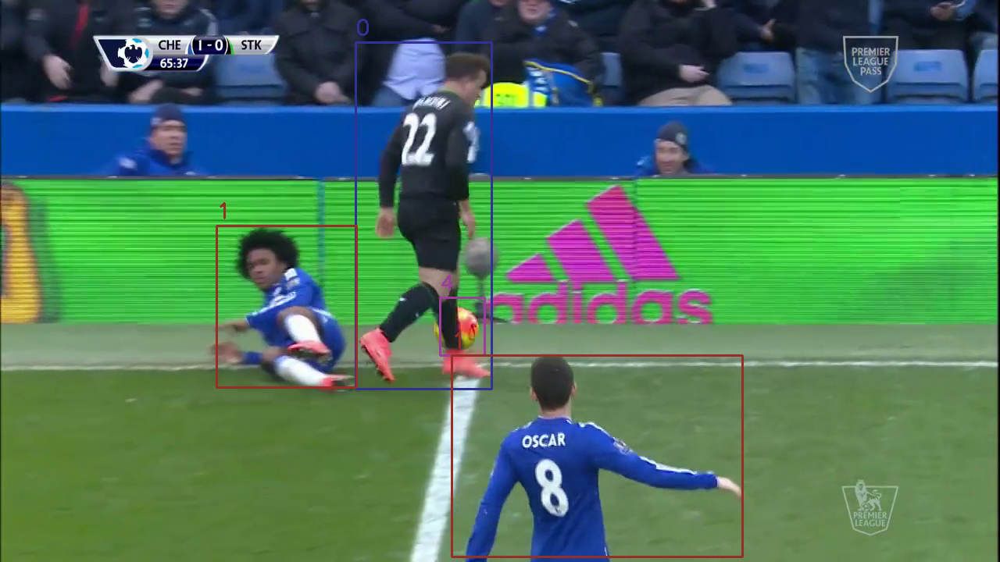

Processing: 12240.png


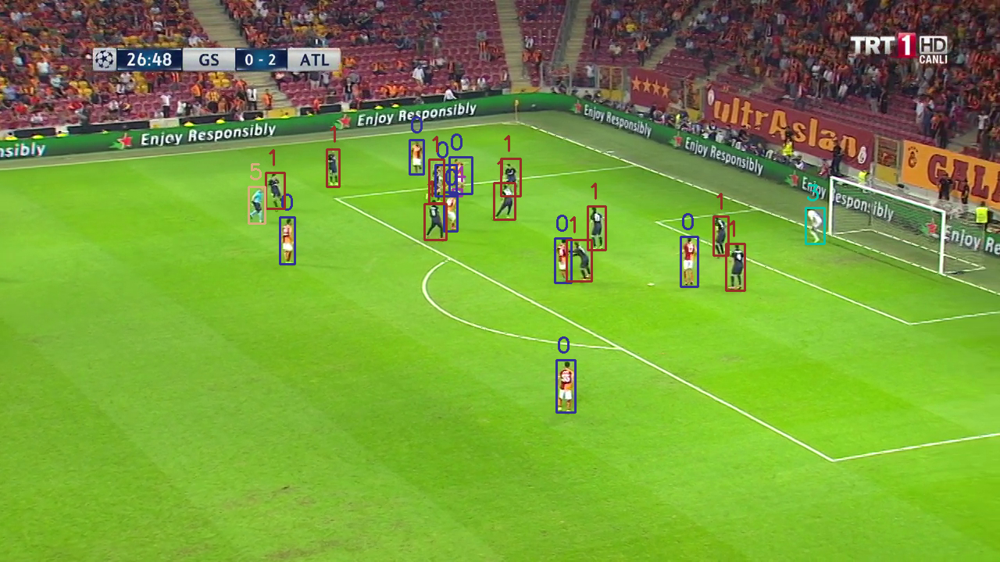

Processing: 9732.png


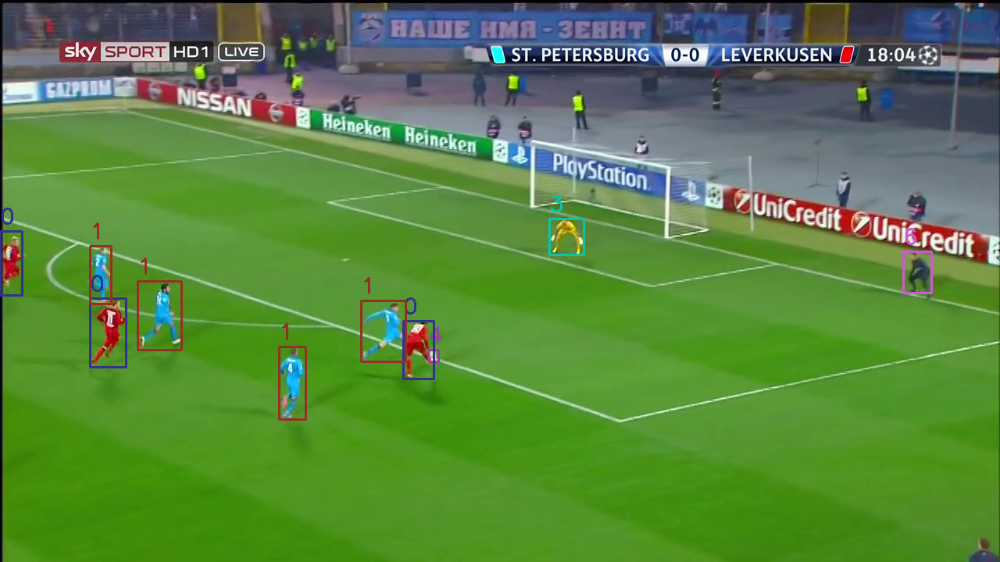

In [24]:
random.seed(15)

dataset_path = Path("/content/drive/My Drive/soccerNet_yolo8_dataset_new")
train_images_path = dataset_path / "train" / "images"
train_labels_path = dataset_path / "train" / "labels"

box_colors = {
    "0": (150, 50, 50),
    "1": (37, 47, 150),
    "2": (41, 248, 165),
    "3": (166, 196, 10),
    "4": (155, 62, 157),
    "5": (123, 174, 213),
    "6": (217, 89, 204),
    "7": (22, 11, 15)
}

train_images_names = list(train_images_path.glob("*.jpg")) + list(train_images_path.glob("*.png")) + list(train_images_path.glob("*.jpeg"))

num_samples = min(5, len(train_images_names))

random_images = random.sample(train_images_names, k=num_samples)

for img_path in random_images:
    img_name = img_path.stem
    print(f"Processing: {img_path.name}")

    img = cv2.imread(str(img_path))

    label_path = train_labels_path / f"{img_name}.txt"

    if label_path.exists():
        with open(label_path, "r") as f:
            bounding_boxes = f.readlines()

        for box in bounding_boxes:
            box = box.strip().split()
            label, x, y, w, h = int(box[0]), float(box[1]), float(box[2]), float(box[3]), float(box[4])

            x1 = int((x - w / 2) * img.shape[1])
            y1 = int((y - h / 2) * img.shape[0])
            x2 = int((x + w / 2) * img.shape[1])
            y2 = int((y + h / 2) * img.shape[0])

            color = box_colors.get(str(label), (255, 255, 255))
            cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
            cv2.putText(img, str(label), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2)

    else:
        print(f"⚠️ Warning: Label file not found for {img_path.name}")

    cv2_imshow(img)


In [31]:
dataset_root = Path("/content/drive/My Drive/soccerNet_yolo8_dataset_new")

dataset_paths = {
    "train": dataset_root / "train" / "labels",
    "val": dataset_root / "val" / "labels"
}

labels_mapping = {
    "0": "0",
    "1": "0",
    "2": "1",
    "3": "1",
    "4": "2",
    "5": "3",
    "6": "4",
    "7": "5"
}

processed_labels = {"train": {}, "val": {}}

for dataset_name, labels_path in dataset_paths.items():
    print(f"🔄 Processing {dataset_name} labels...")

    for label_file in tqdm(list(labels_path.glob("*.txt")), desc=f"Updating {dataset_name} labels"):
        with label_file.open("r") as f:
            lines = f.readlines()

        updated_lines = [
            line.replace(line.split()[0], labels_mapping[line.split()[0]], 1) for line in lines
        ]

        processed_labels[dataset_name][label_file.name] = updated_lines

    print(f"✅ Successfully processed labels for {dataset_name} in memory.\n")

print("🚀 All label files successfully processed and stored in memory!")


🔄 Processing train labels...


Updating train labels: 100%|██████████| 10212/10212 [02:22<00:00, 71.61it/s] 


✅ Successfully processed labels for train in memory.

🔄 Processing val labels...


Updating val labels: 100%|██████████| 1276/1276 [00:11<00:00, 111.47it/s]

✅ Successfully processed labels for val in memory.

🚀 All label files successfully processed and stored in memory!


In [32]:
dataset_type = "train"
sample_file = list(processed_labels[dataset_type].keys())[0]

print(f"📝 Updated Labels for {sample_file}:")
print("".join(processed_labels[dataset_type][sample_file]))


📝 Updated Labels for 11501.txt:
2 0.35759765625 0.8104375 0.011210937499999973 0.019763888888888914 
0 0.345640625 0.7533333333333333 0.04264062499999999 0.1011388888888888 
0 0.96175390625 0.3084513888888889 0.015976562500000034 0.07640277777777776 
0 0.47965234374999993 0.5745 0.036070312499999965 0.10238888888888893 
0 0.78353125 0.4038333333333333 0.01764062500000003 0.08097222222222224 
0 0.37742578125000004 0.7545555555555555 0.033445312500000005 0.09897222222222221 
4 0.0273125 0.17681944444444445 0.02109375 0.07763888888888888 
4 0.8209570312499999 0.12583333333333332 0.012507812499999993 0.02472222222222222 



In [33]:
dataset_root = Path("/content/drive/My Drive/soccerNet_yolo8_dataset_new")
yaml_path = dataset_root / "data.yaml"

new_labels = ["Player", "GoalKeeper", "Ball", "Main Referee", "Side Referee", "Staff Member"]

with yaml_path.open("r") as f:
    data = yaml.safe_load(f)

data["nc"] = len(new_labels)
data["names"] = new_labels

modified_yaml = yaml.safe_dump(data)

print("🚀 Updated `data.yaml` in memory:\n")
print(modified_yaml)


🚀 Updated `data.yaml` in memory:

names:
- Player
- GoalKeeper
- Ball
- Main Referee
- Side Referee
- Staff Member
nc: 6
roboflow:
  license: CC BY 4.0
  project: teamsrefgkball-xrdyu
  url: https://universe.roboflow.com/mohamed-badreldin-cp2tc/teamsrefgkball-xrdyu/dataset/5
  version: 5
  workspace: mohamed-badreldin-cp2tc
test: test/images
train: train/images
val: val/images



In [40]:
dataset_root = Path("/content/drive/My Drive/soccerNet_yolo8_dataset_new")

fixed_labels_root = Path("/content/drive/My Drive/soccerNet_yolo8_dataset_fixed")
fixed_labels_root.mkdir(parents=True, exist_ok=True)

fixed_labels_train = fixed_labels_root / "train" / "labels"
fixed_labels_val = fixed_labels_root / "val" / "labels"
fixed_labels_train.mkdir(parents=True, exist_ok=True)
fixed_labels_val.mkdir(parents=True, exist_ok=True)

new_labels = ["Player", "GoalKeeper", "Ball", "Main Referee", "Side Referee", "Staff Member"]
num_classes = len(new_labels)

for dataset_type, fixed_labels_path in [("train", fixed_labels_train), ("val", fixed_labels_val)]:
    labels_path = dataset_root / dataset_type / "labels"

    print(f"🔄 Checking & Fixing labels for {dataset_type}...")
    for label_file in tqdm(labels_path.glob("*.txt"), desc=f"Processing {dataset_type} labels"):
        with label_file.open("r") as f:
            lines = f.readlines()

        corrected_lines = [
            line for line in lines if int(line.split()[0]) < num_classes
        ]

        fixed_label_file = fixed_labels_path / label_file.name
        with fixed_label_file.open("w") as f:
            f.writelines(corrected_lines)

print("✅ Fixed labels successfully saved in Google Drive at:", fixed_labels_root)


🔄 Checking & Fixing labels for train...


Processing train labels: 10212it [03:55, 43.34it/s]


🔄 Checking & Fixing labels for val...


Processing val labels: 1276it [00:23, 54.66it/s]

✅ Fixed labels successfully saved in Google Drive at: /content/drive/My Drive/soccerNet_yolo8_dataset_fixed


In [41]:
fixed_yaml_path = fixed_labels_root / "data.yaml"

yaml_path = dataset_root / "data.yaml"
with yaml_path.open("r") as f:
    data = yaml.safe_load(f)

data["nc"] = num_classes
data["names"] = new_labels
data["train"] = str(dataset_root / "train" / "images")
data["val"] = str(dataset_root / "val" / "images")
data["labels"] = str(fixed_labels_root)

with fixed_yaml_path.open("w") as f:
    yaml.safe_dump(data, f)

print("🚀 Updated `data.yaml` saved at:", fixed_yaml_path)


🚀 Updated `data.yaml` saved at: /content/drive/My Drive/soccerNet_yolo8_dataset_fixed/data.yaml


In [6]:
model = YOLO("yolov8m.yaml").load("yolov8m.pt")

training_results_path = fixed_labels_root / "yolo_training"

results = model.train(
    data=str(fixed_yaml_path),
    lr0=0.03,      
    epochs=10,       
    imgsz=720,       
    batch=16,      
    resume=False,   
    project=str(training_results_path),
    cache=False
)

Transferred 475/475 items from pretrained weights
Ultralytics 8.3.70 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.yaml, data=/content/drive/My Drive/soccerNet_yolo8_dataset_fixed/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=720, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/My Drive/soccerNet_yolo8_dataset_fixed/yolo_training, name=train, exist_ok=False, pretrained=yolov8m.pt, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None,